<a href="https://colab.research.google.com/github/Fabio-Morganti/Progetto-Python-Data-Science/blob/main/Progetto_Python_Clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, DBSCAN
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
import plotly.express as px

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Progetto Python/dataset_normalized.csv')
df.head()

,Severity,Side,State,Timezone,Wind_Direction,Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Astronomical_Twilight,Orario,Day_of_week,Season,Start_Lat,Start_Lng,Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Temperature(C),Durations,Year,Month
0,0.333333,1.0,0.6875,0.333333,0.695652,0.621359,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1.0,0.0,0.0,0.333333,0.666667,0.593479,0.713122,1.000000,0.513687,0.071429,0.004254,0.498803,0.000043,0.0,0.090909
1,0.333333,1.0,0.6875,0.333333,0.695652,0.592233,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.333333,0.666667,0.616576,0.710386,0.888889,0.513340,0.042857,0.004254,0.498803,0.000043,0.0,0.090909
2,0.333333,1.0,0.6875,0.333333,0.956522,0.621359,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.333333,0.666667,0.621915,0.709645,1.000000,0.513514,0.050000,0.004254,0.490822,0.000043,0.0,0.090909
3,0.666667,1.0,0.6875,0.333333,0.913043,0.679612,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.333333,0.666667,0.629873,0.729167,0.929293,0.513167,0.035714,0.007049,0.497207,0.000043,0.0,0.090909
4,0.333333,0.0,0.6875,0.333333,0.434783,0.592233,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.333333,0.666667,0.623243,0.709451,0.888889,0.513340,0.071429,0.007049,0.498803,0.000043,0.0,0.090909


In [ ]:
df_completo = df

In [ ]:
df = df_completo[['Severity',	'Durations']]

In [ ]:
df.shape

(1247246, 2)

In [ ]:
n = df.shape[0]
df = df.iloc[0:int(n*0.2), :]
df.shape

(249449, 2)

In [ ]:
df.dtypes

Severity     float64
Durations    float64
dtype: object

In [ ]:
model = KMeans()

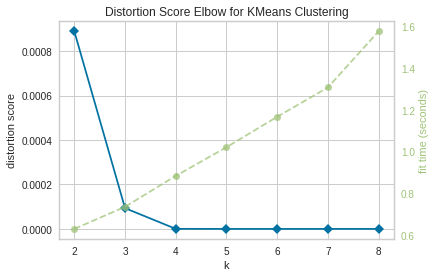

<Figure size 432x288 with 0 Axes>

In [ ]:
visualizer = KElbowVisualizer(model, k=(2,9))

visualizer.fit(df)        # Fit the data to the visualizer
visualizer.poof()        # Finalize and render the figure
plt.savefig('/content/drive/MyDrive/Progetto Python/Elbow cluster.png')

In [ ]:
model = KMeans(3, random_state=42)
model.fit(df)
label = model.labels_

In [ ]:
print(silhouette_score(df, label))

0.9990009387380353


In [ ]:
df_kmeans= df
df_kmeans['label'] = label

In [ ]:
plt.figure()
fig = px.scatter(df_kmeans, x="Severity", y="Durations", color="label")
plt.savefig('/content/drive/MyDrive/Progetto Python/cluster KMeans.png')
fig.show()

<Figure size 432x288 with 0 Axes>

In [ ]:
df_db = df_completo[['Severity',	'Durations', 'Humidity(%)',	'Pressure(in)',	'Visibility(mi)',	'Wind_Speed(mph)',	'Temperature(C)']]

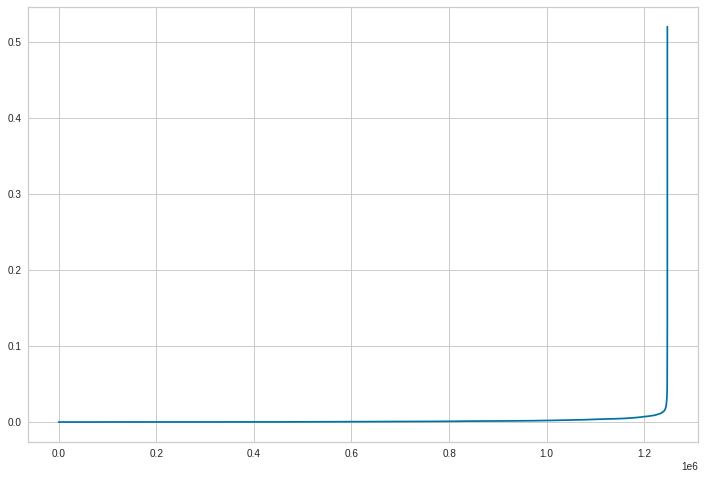

In [ ]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(df_db)
distances, indices = nbrs.kneighbors(df_db)

distances = np.sort(distances, axis=0)
plt.figure(figsize=(12,8))
plt.plot(distances[:,1])
plt.savefig('/content/drive/MyDrive/Progetto Python/KNearest.png')

In [ ]:
db = DBSCAN(eps=0.02, min_samples=2).fit(df_db)
ymeans = db.labels_
ymeans

In [ ]:
ymeans.nunique()

In [ ]:
score = silhouette_score(df_db, ymeans)
score

NameError: ignored

In [ ]:
df_db['Label'] = ymeans

NameError: ignored